In [125]:
from __future__ import division
import os
import string
import cufflinks as cf
import pandas as pd
import numpy as np
import plotly.plotly as py
import plotly.tools as tls
import plotly.graph_objs as go
import plotly.offline as offline
import seaborn as sns
from plotly import tools
from plotly.tools import FigureFactory as FF
from scipy import stats, integrate
from scipy.stats import t
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter

%matplotlib inline
sns.set(rc={'figure.figsize':(100,70)},font='sans-serif', font_scale=7,color_codes=True)
np.random.seed(sum(map(ord,"distributions")))

import statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols
cf.set_config_file(offline=True,world_readable=True,theme='ggplot')
df = pd.read_csv('/Users/nickpourazima/GitHub/he-sm/Completed Tests/Combo/FinalMaster.csv',parse_dates=True)
users = ['394','390','399','486','591','510','729','932','521','514','379','824','506','552','367','410']
testList = ['A1a1','A1a2','A1a3','A1a4','A1b1','A1b2','A1b3','A1b4','A2a1','A2a2','A2a3','A2a4','A2b1','A2b2','A2b3','A2b4',
       'A3a1','A3a2','A3a3','A3a4','A3b1','A3b2','A3b3','A3b4','A4a1','A4a2','A4a3','A4a4','A4b1','A4b2','A4b3','A4b4',
       'H1a1','H1a2','H1a3','H1a4','H1b1','H1b2','H1b3','H1b4','H2a1','H2a2','H2a3','H2a4','H2b1','H2b2','H2b3','H2b4']
hapticTests=['H1a1','H1a2','H1a3','H1a4','H1b1','H1b2','H1b3','H1b4','H2a1','H2a2','H2a3','H2a4','H2b1','H2b2','H2b3','H2b4']
audibleTests=['A1a1','A1a2','A1a3','A1a4','A1b1','A1b2','A1b3','A1b4','A2a1','A2a2','A2a3','A2a4','A2b1','A2b2','A2b3','A2b4',
       'A3a1','A3a2','A3a3','A3a4','A3b1','A3b2','A3b3','A3b4','A4a1','A4a2','A4a3','A4a4','A4b1','A4b2','A4b3','A4b4']
h1=['H1a1','H1a2','H1a3','H1a4','H1b1','H1b2','H1b3','H1b4']
h2=['H2a1','H2a2','H2a3','H2a4','H2b1','H2b2','H2b3','H2b4']
a1=['A1a1','A1a2','A1a3','A1a4','A1b1','A1b2','A1b3','A1b4']
a2=['A2a1','A2a2','A2a3','A2a4','A2b1','A2b2','A2b3','A2b4']
a3=['A3a1','A3a2','A3a3','A3a4','A3b1','A3b2','A3b3','A3b4']
a4=['A4a1','A4a2','A4a3','A4a4','A4b1','A4b2','A4b3','A4b4']
h1a=['H1a1','H1a2','H1a3','H1a4']
h1b=['H1b1','H1b2','H1b3','H1b4']
a1a=['A1a1','A1a2','A1a3','A1a4']
a1b=['A1b1','A1b2','A1b3','A1b4']
a2a=['A2a1','A2a2','A2a3','A2a4']
a2b=['A2b1','A2b2','A2b3','A2b4']
a3a=['A3a1','A3a2','A3a3','A3a4']
a3b=['A3b1','A3b2','A3b3','A3b4']
a4a=['A4a1','A4a2','A4a3','A4a4']
a4b=['A4b1','A4b2','A4b3','A4b4']
h2a=['H2a1','H2a2','H2a3','H2a4']
h2b=['H2b1','H2b2','H2b3','H2b4']
df = df[df.Test.isin(testList)]
df = df[df["User ID"].isin(users)]
# df["Sanitized Asynchrony"]=df["Sanitized Asynchrony"].abs()
# df["Latency Corrected Sanitized Asynchrony"]=df["Latency Corrected Sanitized Asynchrony"].abs()

In [60]:
df.columns

Index(['Unnamed: 0', 'Asynchrony', 'Group', 'IOI', 'Instrument', 'Max',
       'Mean Asynchrony', 'Min', 'Missed Taps', 'Phase Correction Response',
       'Sanitized Asynchrony', 'Sanitized Mean Asynchrony',
       'Sanitized Std Dev Asynchrony', 'Sanitized Tap Onset',
       'Std Dev Asynchrony', 'Tap Onset', 'Test', 'True Onset', 'User ID',
       'Latency Correction Factor', 'Latency Corrected Sanitized Asynchrony',
       'Type'],
      dtype='object')

In [53]:
labels = df["Instrument"]
values = df["User ID"]
trace = go.Pie(labels=labels, values=values)
py.iplot([trace], filename='basic_pie_chart')

In [36]:
#linear increase in NMA as IOI increases for non musicians
nm = df[df["Group"].isin(["Neither"])]
nm = df[df.Test.isin(hapticTests)]
# sns.regplot(x='IOI',y=nm['Latency Corrected Sanitized Asynchrony'].abs(),data = nm,x_estimator=np.mean)

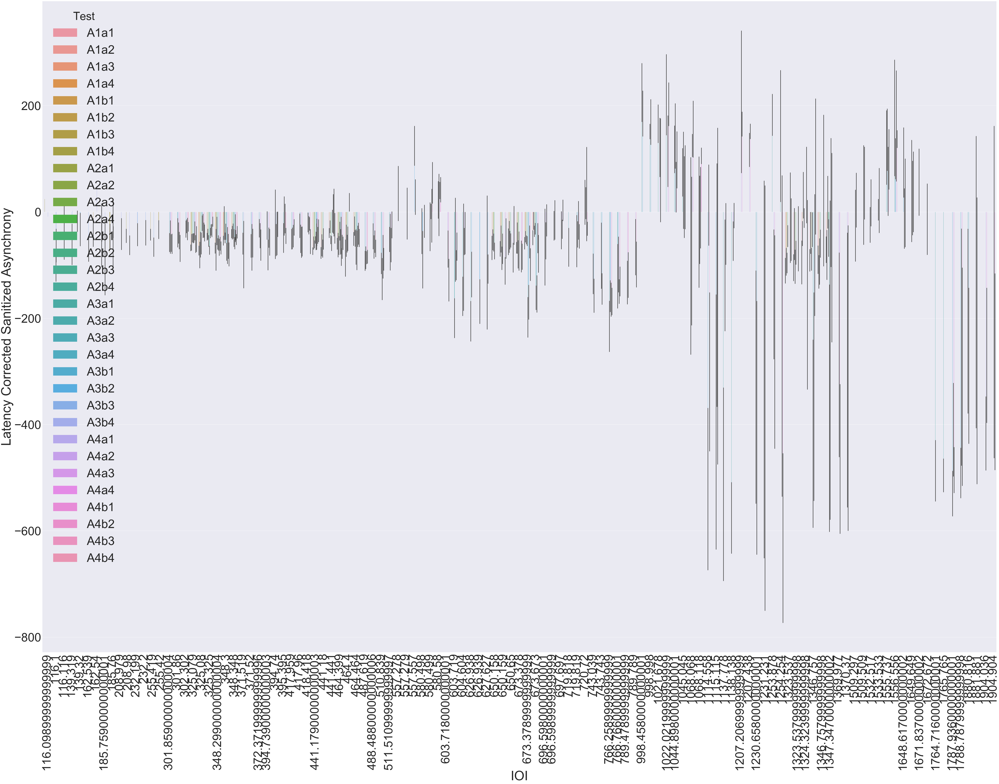

In [236]:
f = df[df["Test"].isin(audibleTests)]
plt.xticks(rotation=90)
# f.IOI = pd.to_timedelta(f.IOI, unit='ms')
# f.IOI = pd.to_datetime(f.IOI,unit='ms')
# f = f.set_index('IOI')
sns.barplot(x=f.IOI, y=f["Latency Corrected Sanitized Asynchrony"], hue="Test", data=f,dodge=True)
# ,markers=["o", "x","^"],linestyles=["-", "--",":"])
# .xaxis.set_major_formatter(FormatStrFormatter('%0.2f'));

In [ ]:
g = df2[df2["Test"].isin(hapticTests)]
plt.xticks(rotation=90)
sns.barplot(x=g.IOI, y=g["Latency Corrected Sanitized Asynchrony"], hue="Test", data=g,dodge=True)
#             ,markers=["o", "x","^"],linestyles=["-", "--",":"]);
# .xaxis.set_major_formatter(FormatStrFormatter('%0.2f'));

KeyboardInterrupt: 

In [61]:
def kde_plot(df, conditions, dv, col_name, save_file=False):
    sns.set_style('white')
    sns.set_style('ticks')
    fig, ax = plt.subplots()
 
    for condition in conditions:
        condition_data = df[(df[col_name] == condition)][dv]
        sns.kdeplot(condition_data, shade=True, label=condition)
        
    sns.despine()
    
    if save_file:
        plt.savefig("kernel_density_estimate_seaborn_python_response"
                     "-time.png")
    plt.show()
    
def cdf(df, conditions=['A1a1', 'H1a1']):
 
    data = {i: df[(df.Test == conditions[i])] for i in range(len(
        conditions))}
    plot_data = []
 
    for i, condition in enumerate(conditions):
 
        rt = data[i]["Sanitized Asynchrony"].sort_values()
        yvals = np.arange(len(rt)) / float(len(rt))
 
        # Append it to the data
        cond = [condition]*len(yvals)
 
        df = pd.DataFrame(dict(dens=yvals, dv=rt, condition=cond))
        plot_data.append(df)
 
    plot_data = pd.concat(plot_data, axis=0)
 
    return plot_data

def cdf_plot(cdf_data, save_file=False, legend=True):
    sns.set_style('white')
    sns.set_style('ticks')
    sns.set(rc={'figure.figsize':(100,60)},font='sans-serif', font_scale=1,color_codes=True)
    g = sns.FacetGrid(cdf_data, size=10, hue="condition")
    g.map(plt.plot, "dv", "dens", alpha=.7, linewidth=1)
    if legend:
        g.add_legend(title="Congruency")
    g.set_axis_labels("Response Time (ms.)", "Probability")
    g.fig.suptitle('Cumulative Distribution Function')
 
    if save_file:
        g.savefig("cumulative_distribution_function_seaborn_python_response"
                  "-time.png")
 
    plt.show()
    
def calc_delta_data(df, subid, dv, condition, conditions=['A1a1',
                                                   'H1a1']):
  
    subjects = pd.Series(df[subid].values.ravel()).unique().tolist()
    subjects.sort()
 
    deciles = np.arange(0.1, 1., 0.1)
 
    cond_one = conditions[0]
    cond_two = conditions[1]
 
    # Frame to store the data (per subject)
    arrays = [np.array([cond_one, cond_two]).repeat(len(deciles)),
              np.array(deciles).tolist() * 2]
    data_delta = pd.DataFrame(columns=subjects, index=arrays)
 
    for subject in subjects:
 
        sub_data_inc = df.loc[(df[subid] == subject) & (df[condition] ==
                                                        cond_one)]
        sub_data_con = df.loc[(df[subid] == subject) & (df[condition] ==
                                                        cond_two)]
 
        inc_q = sub_data_inc[dv].quantile(q=deciles).values
        con_q = sub_data_con[dv].quantile(q=deciles).values
        for i, dec in enumerate(deciles):
            data_delta.loc[(cond_one, dec)][subject] = inc_q[i]
            data_delta.loc[(cond_two, dec)][subject] = con_q[i]
 
 
    # Aggregate deciles
    data_delta = data_delta.mean(axis=1).unstack(level=0)
    # Calculate difference
    data_delta['Diff'] = data_delta[cond_one] - data_delta[cond_two]
    # Calculate average
    data_delta['Average'] = (data_delta[cond_one] + data_delta[cond_two]) / 2
 
    return data_delta

def delta_plot(delta_data, save_file=False):
 
    ymax = delta_data['Diff'].max() + 10
    ymin = -10
    xmin = delta_data['Average'].min() - 20
    xmax = delta_data['Average'].max() + 20
 
    sns.set_style('white')
    g = sns.FacetGrid(delta_data, ylim=(ymin, ymax), xlim=(xmin, xmax), size=8)
    g.map(plt.scatter, "Average", "Diff", s=50, alpha=.7, linewidth=1,
          edgecolor="white")
    g.map(plt.plot, "Average", "Diff", alpha=.7, linewidth=1)
    g.set_axis_labels("Avarage RTs (ms.)", "Effect (ms.)")
    g.fig.suptitle('Delta Plot')
    if save_file:
        g.savefig("delta_plot_seaborn_python_response-time.png")
 
    plt.show()

In [20]:
i=0;
j=0;
for item in pd.loc[pd['User ID']]:
    if(item == users[i]):
        for test in pd['Test']:
            if(test == testList[j]):
                pd['Corrected Mean'] = pd['Sanitized Asynchrony'].mean(skipna=False)
            else:
                j=j+1
    else:
        i=i+1

IndexError: list index out of range

In [18]:
filter1DF = pd.loc[(pd['User ID']==591)]
i=0;
j=0;
for x in filter1DF['Test']:
    if (x == testList[i]):
        filter1DF['Phase Correction Response'] = filter1DF['Sanitized Asynchrony'].shift(-1)-filter1DF['Sanitized Asynchrony']
    else:
        i=i+1
# print(filter1DF['Phase Correction Response'])
# filter1DF['Phase Correction Response'] = filter1DF['Test'].apply(lambda x: filter1DF['Sanitized Asynchrony'].shift(-1)-filter1DF['Sanitized Asynchrony'] if x == 'A1a1' else np.NaN)
filter1DF.to_csv("591 Mod.csv")

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



/usr/local/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning:

invalid value encountered in greater

/usr/local/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning:

invalid value encountered in less



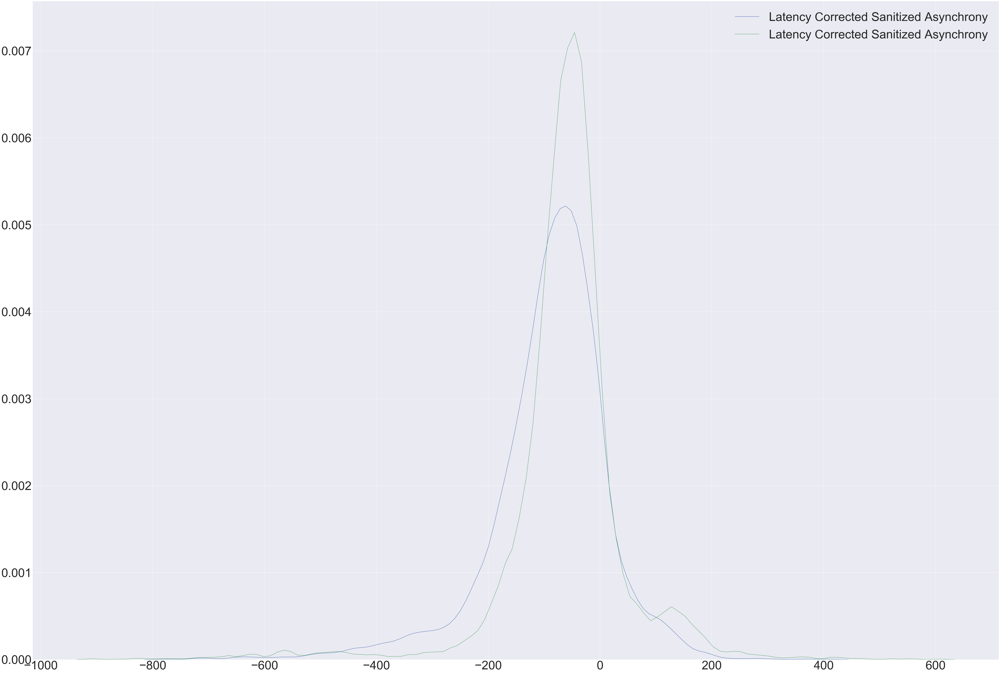

In [57]:
sns.kdeplot(df["Latency Corrected Sanitized Asynchrony"][df.Test.isin(hapticTests)])
sns.kdeplot(df["Latency Corrected Sanitized Asynchrony"][df.Test.isin(audibleTests)])

/usr/local/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning:

invalid value encountered in greater

/usr/local/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning:

invalid value encountered in less



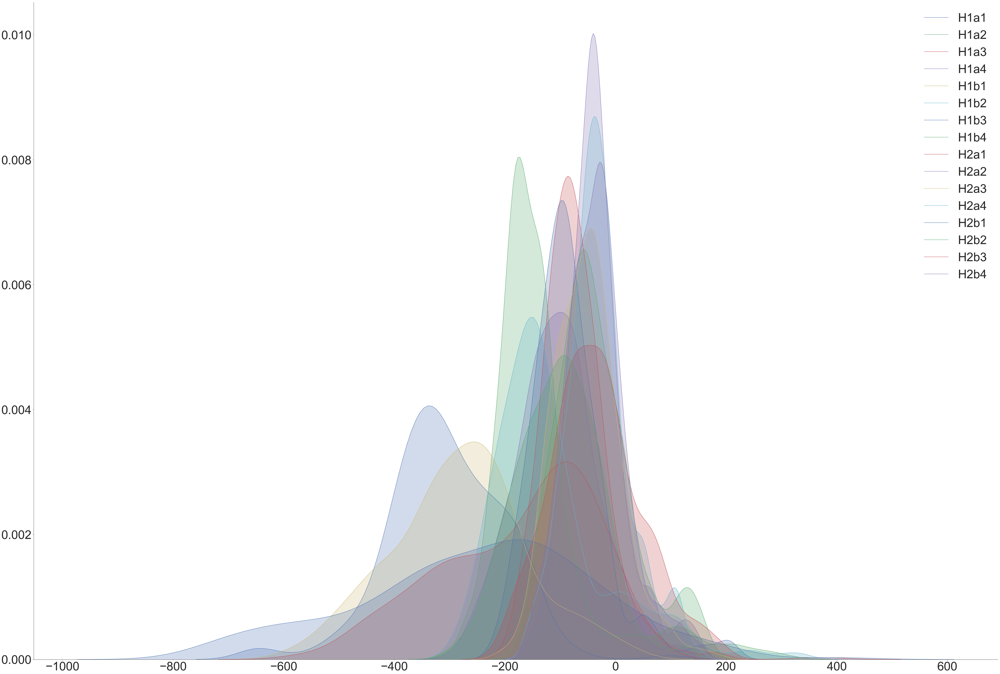

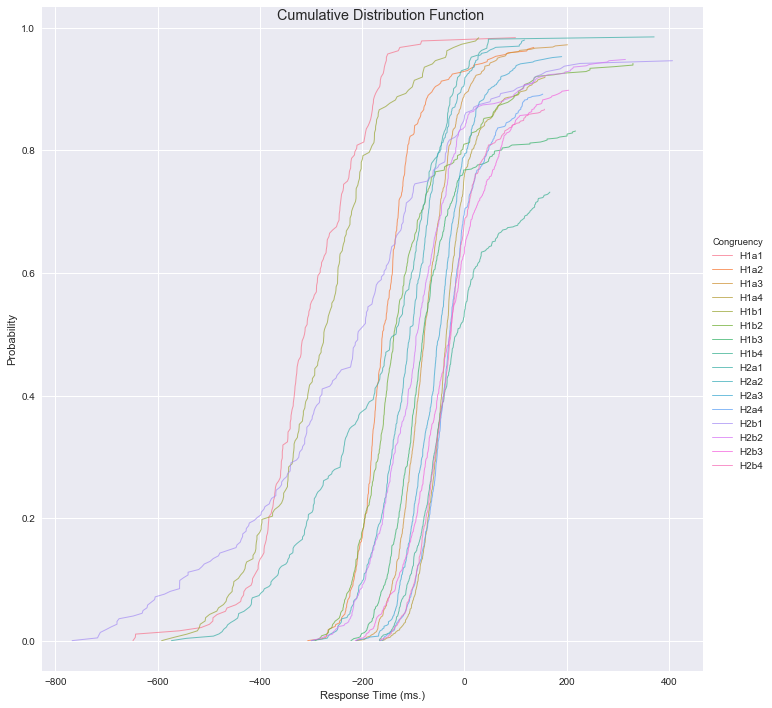

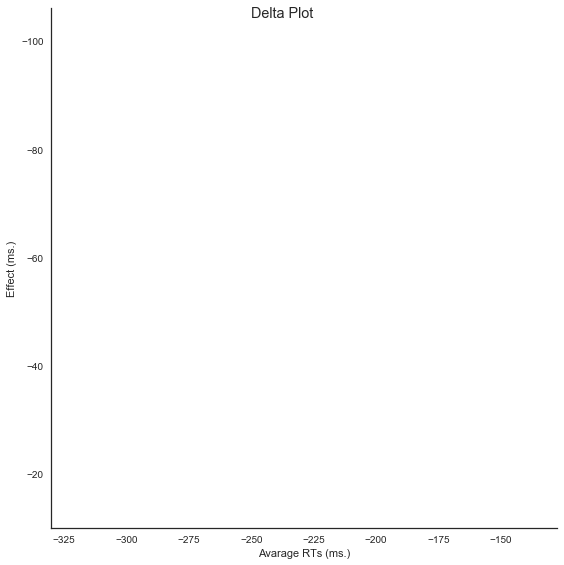

In [62]:
kde_plot(df, hapticTests, 'Sanitized Asynchrony', 'Test', save_file=False);
cdf_dat = cdf(df, conditions=hapticTests)
cdf_plot(cdf_dat, legend=True, save_file=False)
d_data = calc_delta_data(df, "User ID", "Sanitized Asynchrony", "Test", hapticTests)
delta_plot(d_data)

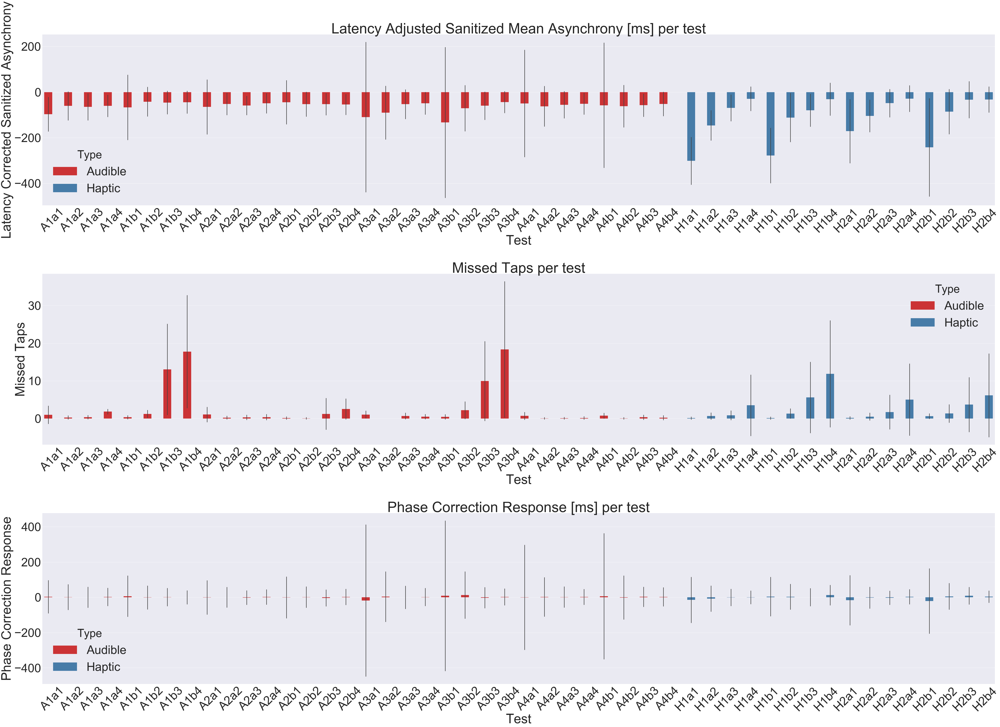

In [84]:
fig, axs = plt.subplots(nrows=3);
plt.subplots_adjust(hspace=0.4, wspace=0.4)
plt.setp(axs[0].xaxis.get_majorticklabels(), rotation=45)
plt.setp(axs[1].xaxis.get_majorticklabels(), rotation=45)
plt.setp(axs[2].xaxis.get_majorticklabels(), rotation=45)
sns.barplot(x="Test",y="Latency Corrected Sanitized Asynchrony",hue="Type",palette="Set1",data=df,dodge=True,ax=axs[0],order=testList,ci="sd").set_title("Latency Adjusted Sanitized Mean Asynchrony [ms] per test");
sns.barplot(x="Test",y="Missed Taps",hue="Type",palette="Set1",data=df,dodge=True,ax=axs[1],order=testList,ci="sd").set_title("Missed Taps per test");
sns.barplot(x="Test",y="Phase Correction Response",palette="Set1",hue="Type",data=df,dodge=True,ax=axs[2],order=testList,ci="sd").set_title("Phase Correction Response [ms] per test");
plt.savefig('AllSummary.png');

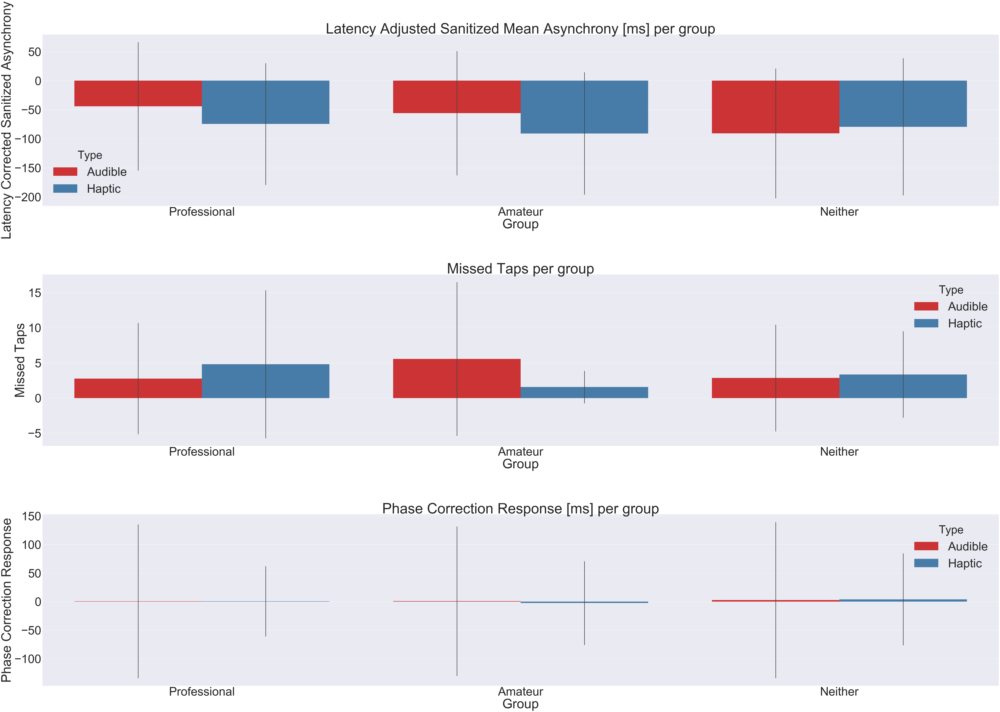

In [75]:
fig, axs = plt.subplots(nrows=3);
plt.subplots_adjust(hspace=0.4, wspace=0.4)
sns.barplot(x="Group",y="Latency Corrected Sanitized Asynchrony",hue="Type",palette="Set1",data=df,dodge=True,ax=axs[0],order = ['Professional', 'Amateur', 'Neither'],ci="sd").set_title("Latency Adjusted Sanitized Mean Asynchrony [ms] per group"); 
sns.barplot(x="Group",y="Missed Taps",hue="Type",palette="Set1",data=df,dodge=True,ax=axs[1],order = ['Professional', 'Amateur', 'Neither'],ci="sd").set_title("Missed Taps per group");
sns.barplot(x="Group",y="Phase Correction Response",hue="Type",palette="Set1",data=df,dodge=True,ax=axs[2],order = ['Professional', 'Amateur', 'Neither'],ci="sd").set_title("Phase Correction Response [ms] per group"); 
plt.savefig('GroupSummaries.png');

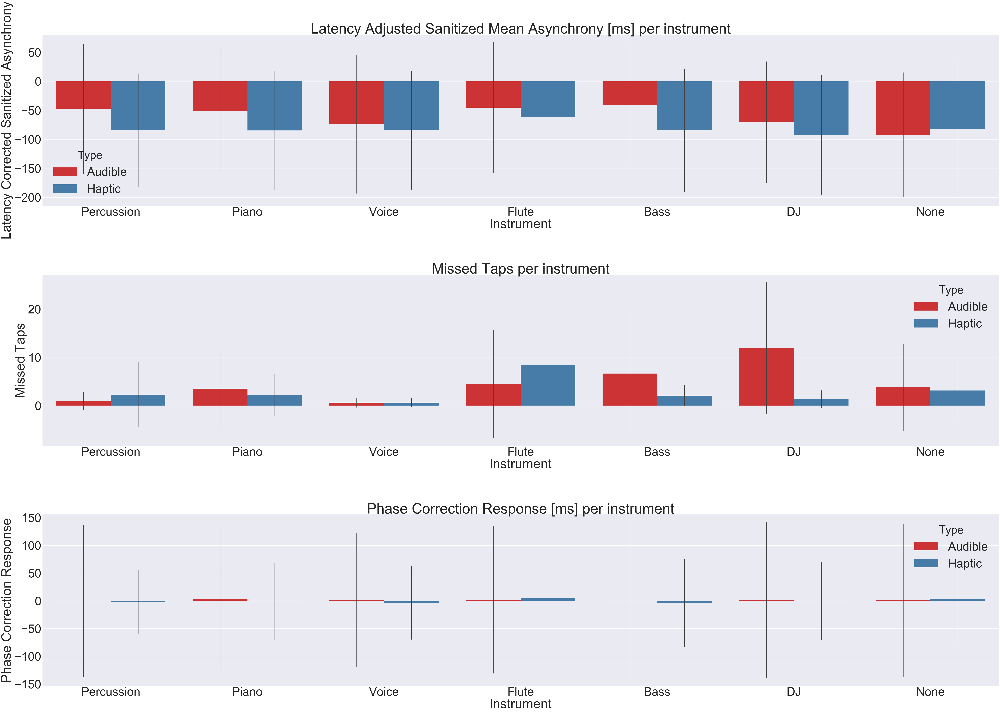

In [76]:
fig, axs = plt.subplots(nrows=3); 
# plt.subplots_adjust(top=.9);
# fig.tight_layout()
plt.subplots_adjust(hspace=0.4, wspace=0.4)
sns.barplot(x="Instrument",y="Latency Corrected Sanitized Asynchrony",hue="Type",palette="Set1",data=df,dodge=True,ax=axs[0],ci="sd").set_title("Latency Adjusted Sanitized Mean Asynchrony [ms] per instrument"); 
sns.barplot(x="Instrument",y="Missed Taps",hue="Type",palette="Set1",data=df,dodge=True,ax=axs[1],ci="sd").set_title("Missed Taps per instrument");
sns.barplot(x="Instrument",y="Phase Correction Response",hue="Type",palette="Set1",data=df,dodge=True,ax=axs[2],ci="sd").set_title("Phase Correction Response [ms] per instrument");
plt.savefig('InstrumentSummaries.png');

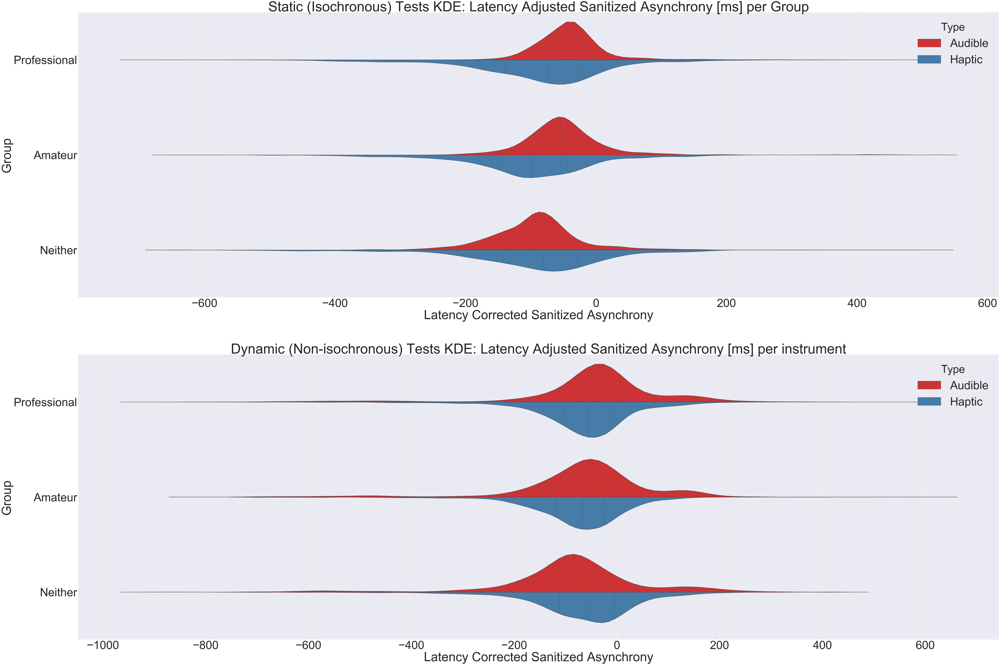

In [111]:
# with sns.color_palette("muted"):
fig, axs = plt.subplots(nrows=2)
a = df[df.Test.isin(a1+a2+h1)]
b = df[df.Test.isin(a3+a4+h2)]
sns.violinplot(a["Latency Corrected Sanitized Asynchrony"],a.Group,split=True,hue=a["Type"],palette="Set1",ax=axs[0],inner="quartile",scale="count",bw=.2).set_title("Static (Isochronous) Tests KDE: Latency Adjusted Sanitized Asynchrony [ms] per Group");
sns.violinplot(b["Latency Corrected Sanitized Asynchrony"],b.Group,split=True,hue=b["Type"],palette="Set1",ax=axs[1],inner="quartile",scale="count",bw=.2).set_title("Dynamic (Non-isochronous) Tests KDE: Latency Adjusted Sanitized Asynchrony [ms] per instrument");
plt.savefig("LCSA_KDE.png")

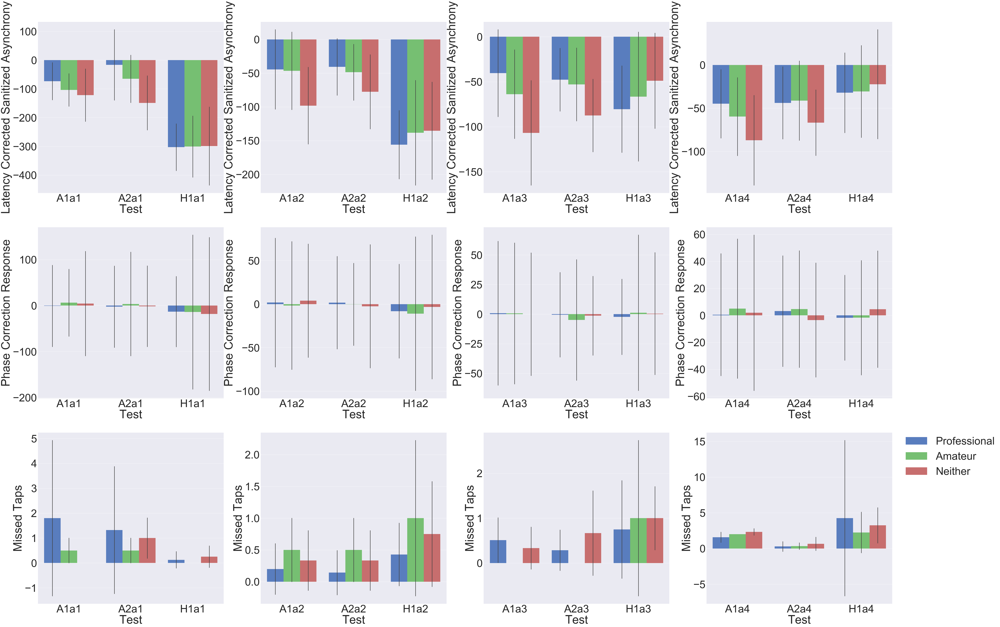

In [91]:
with sns.color_palette("muted"):
    fig, axs = plt.subplots(3,4,sharex=False, sharey=False)
    testList= ['A1a1','A2a1','H1a1']
    testList2 = ['A1a2','A2a2','H1a2']
    testList3 = ['A1a3','A2a3','H1a3']
    testList4= ['A1a4','A2a4','H1a4']
    newdf = df[df.Test.isin(testList)]
    newdf2 = df[df.Test.isin(testList2)]
    newdf3 = df[df.Test.isin(testList3)]
    newdf4 = df[df.Test.isin(testList4)]
    a = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf,ax=axs[0][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    b = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf2,ax=axs[0][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    c = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf3,ax=axs[0][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    d = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf4,ax=axs[0][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    e = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf,ax=axs[1][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    f = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf2,ax=axs[1][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    g = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf3,ax=axs[1][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    h = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf4,ax=axs[1][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    i = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf,dodge=True,ax=axs[2][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    j = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf2,dodge=True,ax=axs[2][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    k = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf3,dodge=True,ax=axs[2][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    l = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf4,dodge=True,ax=axs[2][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    a.legend_.remove();b.legend_.remove();c.legend_.remove();d.legend_.remove();e.legend_.remove();f.legend_.remove();g.legend_.remove();h.legend_.remove();
    i.legend_.remove();j.legend_.remove();k.legend_.remove();l.legend_.remove();
    plt.legend(bbox_to_anchor=(1.05, 1), borderaxespad=0.);
    plt.savefig('GroupPerTestSetGrid1.png');

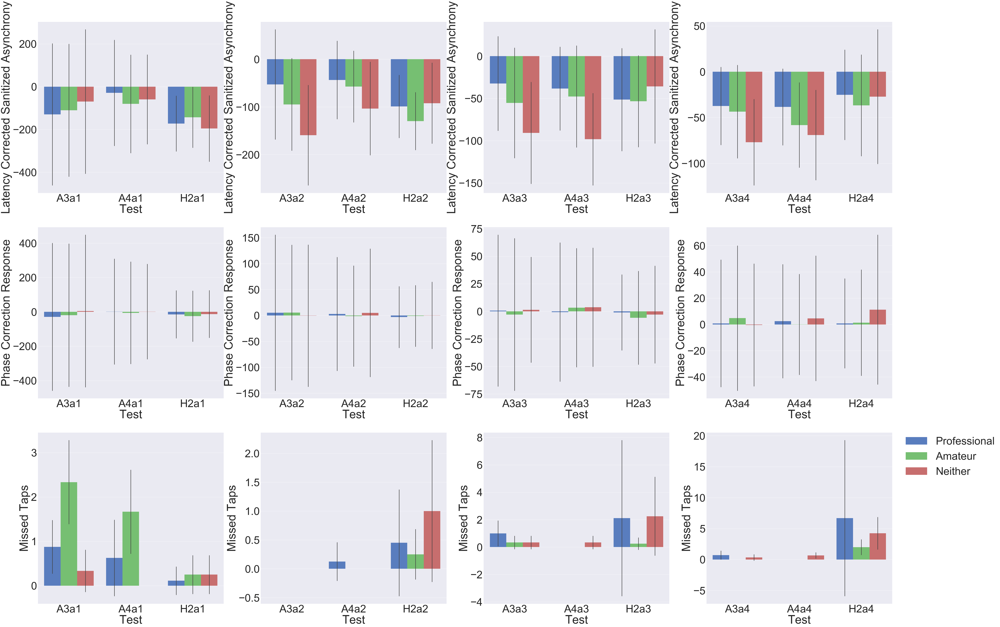

In [92]:
with sns.color_palette("muted"):
    fig, axs = plt.subplots(3,4,sharex=False, sharey=False)
    testList= ['A3a1','A4a1','H2a1']
    testList2 = ['A3a2','A4a2','H2a2']
    testList3 = ['A3a3','A4a3','H2a3']
    testList4= ['A3a4','A4a4','H2a4']
    newdf = df[df.Test.isin(testList)]
    newdf2 = df[df.Test.isin(testList2)]
    newdf3 = df[df.Test.isin(testList3)]
    newdf4 = df[df.Test.isin(testList4)]
    a = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf,ax=axs[0][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    b = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf2,ax=axs[0][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    c = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf3,ax=axs[0][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    d = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf4,ax=axs[0][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    e = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf,ax=axs[1][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    f = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf2,ax=axs[1][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    g = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf3,ax=axs[1][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    h = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf4,ax=axs[1][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    i = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf,dodge=True,ax=axs[2][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    j = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf2,dodge=True,ax=axs[2][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    k = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf3,dodge=True,ax=axs[2][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    l = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf4,dodge=True,ax=axs[2][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    a.legend_.remove();b.legend_.remove();c.legend_.remove();d.legend_.remove();e.legend_.remove();f.legend_.remove();g.legend_.remove();h.legend_.remove();
    i.legend_.remove();j.legend_.remove();k.legend_.remove();l.legend_.remove();
    plt.legend(bbox_to_anchor=(1.05, 1), borderaxespad=0.);
    plt.savefig('GroupPerTestSetGrid2.png');

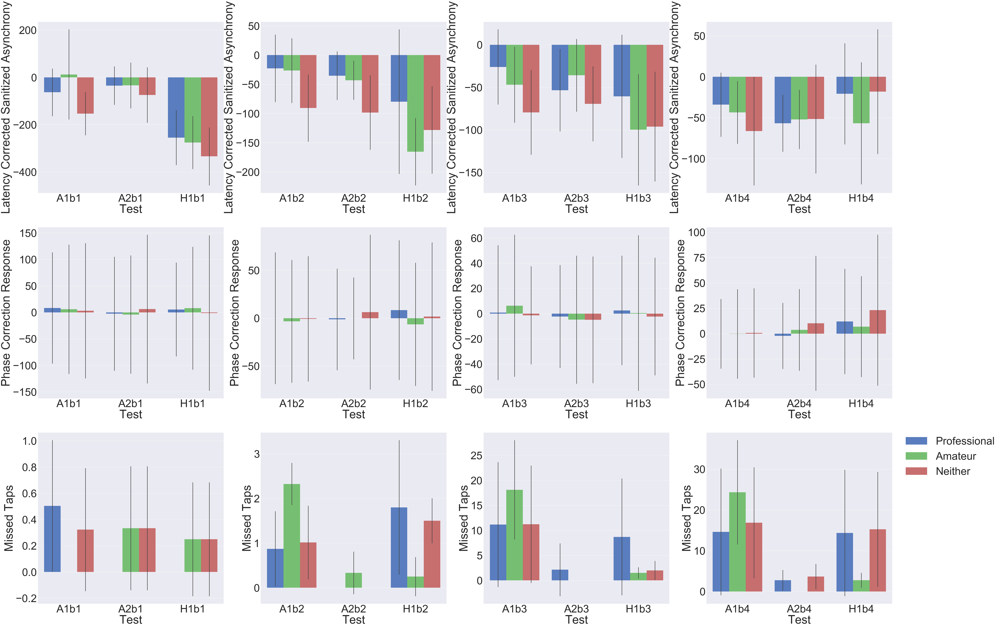

In [93]:
with sns.color_palette("muted"):
    fig, axs = plt.subplots(3,4,sharex=False, sharey=False)
    testList= ['A1b1','A2b1','H1b1']
    testList2 = ['A1b2','A2b2','H1b2']
    testList3 = ['A1b3','A2b3','H1b3']
    testList4= ['A1b4','A2b4','H1b4']
    newdf = df[df.Test.isin(testList)]
    newdf2 = df[df.Test.isin(testList2)]
    newdf3 = df[df.Test.isin(testList3)]
    newdf4 = df[df.Test.isin(testList4)]
    a = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf,ax=axs[0][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    b = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf2,ax=axs[0][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    c = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf3,ax=axs[0][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    d = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf4,ax=axs[0][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    e = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf,ax=axs[1][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    f = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf2,ax=axs[1][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    g = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf3,ax=axs[1][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    h = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf4,ax=axs[1][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    i = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf,dodge=True,ax=axs[2][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    j = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf2,dodge=True,ax=axs[2][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    k = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf3,dodge=True,ax=axs[2][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    l = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf4,dodge=True,ax=axs[2][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    a.legend_.remove();b.legend_.remove();c.legend_.remove();d.legend_.remove();e.legend_.remove();f.legend_.remove();g.legend_.remove();h.legend_.remove();
    i.legend_.remove();j.legend_.remove();k.legend_.remove();l.legend_.remove();
    plt.legend(bbox_to_anchor=(1.05, 1), borderaxespad=0.);
    plt.savefig('GroupPerTestSetGrid3.png');

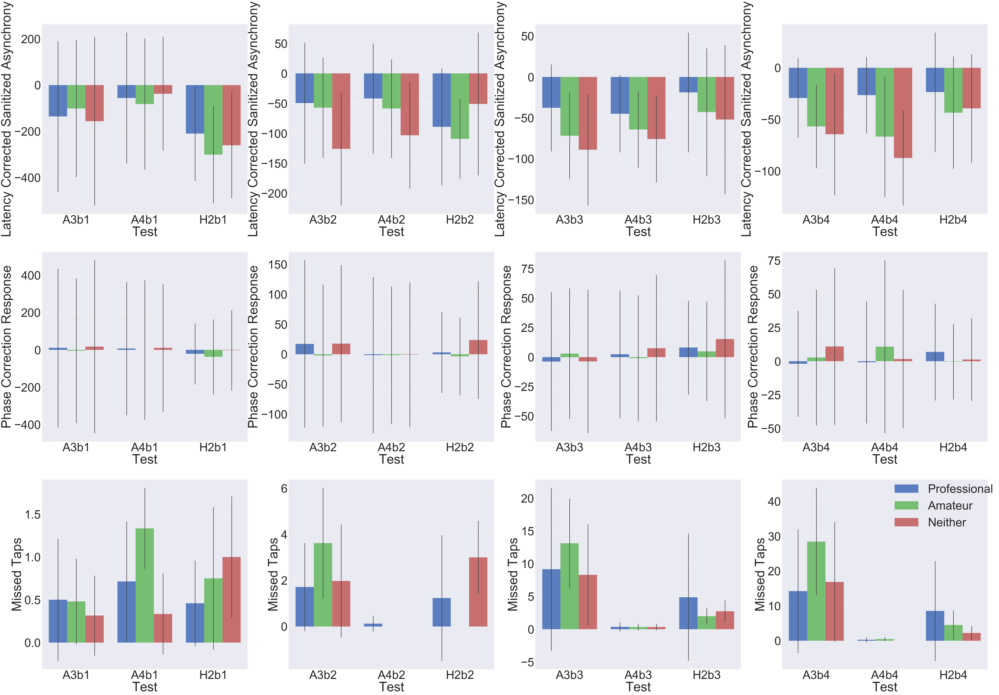

In [94]:
with sns.color_palette("muted"):
    fig, axs = plt.subplots(3,4,sharex=False, sharey=False)
    testList= ['A3b1','A4b1','H2b1']
    testList2 = ['A3b2','A4b2','H2b2']
    testList3 = ['A3b3','A4b3','H2b3']
    testList4= ['A3b4','A4b4','H2b4']
    newdf = df[df.Test.isin(testList)]
    newdf2 = df[df.Test.isin(testList2)]
    newdf3 = df[df.Test.isin(testList3)]
    newdf4 = df[df.Test.isin(testList4)]
    a = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf,ax=axs[0][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    b = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf2,ax=axs[0][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    c = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf3,ax=axs[0][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    d = sns.barplot(y="Latency Corrected Sanitized Asynchrony", x="Test", hue="Group", data=newdf4,ax=axs[0][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    e = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf,ax=axs[1][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    f = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf2,ax=axs[1][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    g = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf3,ax=axs[1][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    h = sns.barplot(y="Phase Correction Response", x="Test", hue="Group", data=newdf4,ax=axs[1][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    i = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf,dodge=True,ax=axs[2][0],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    j = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf2,dodge=True,ax=axs[2][1],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    k = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf3,dodge=True,ax=axs[2][2],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    l = sns.barplot(y="Missed Taps", x="Test", hue="Group", data=newdf4,dodge=True,ax=axs[2][3],hue_order = ['Professional', 'Amateur', 'Neither'],ci="sd")
    a.legend_.remove();b.legend_.remove();c.legend_.remove();d.legend_.remove();e.legend_.remove();f.legend_.remove();g.legend_.remove();h.legend_.remove();
    i.legend_.remove();j.legend_.remove();k.legend_.remove();l.legend_.remove();
    plt.legend(bbox_to_anchor=(1.05, 1), borderaxespad=0.);
    plt.savefig('GroupPerTestSetGrid4.png');

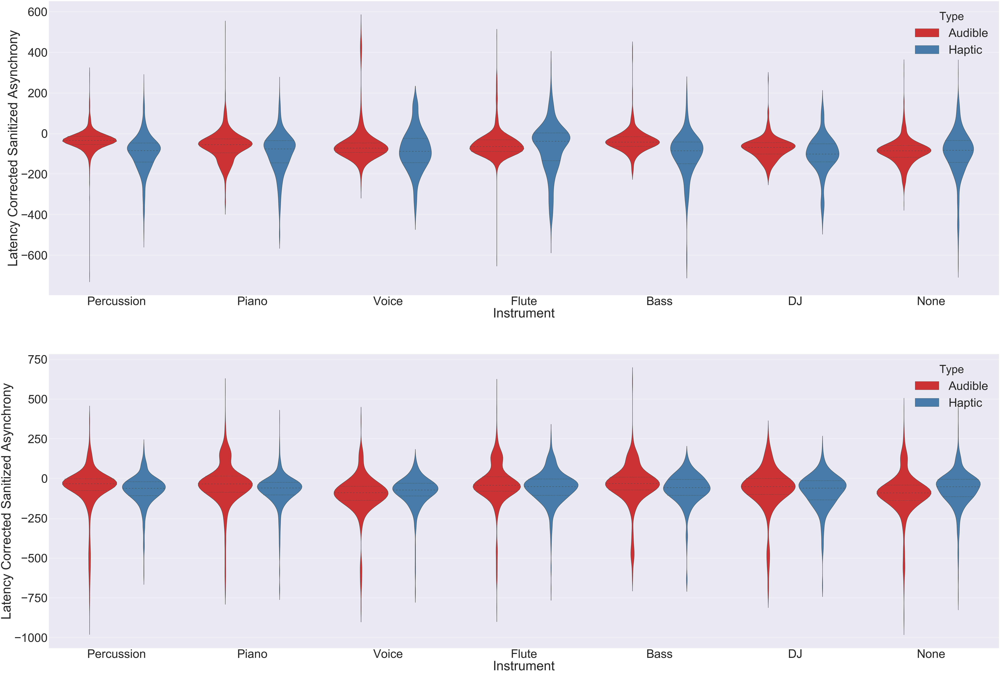

In [115]:
fig, axs = plt.subplots(nrows=2)
a = df[df.Test.isin(a1+a2+h1)]
b = df[df.Test.isin(a3+a4+h2)]
sns.violinplot(y=a["Latency Corrected Sanitized Asynchrony"],x=df.Instrument,hue=a["Type"],palette="Set1",ax=axs[0],inner="quartile",scale="count")
sns.violinplot(y=b["Latency Corrected Sanitized Asynchrony"],x=df.Instrument,hue=b["Type"],palette="Set1",ax=axs[1],inner="quartile",scale="count")
plt.savefig('KDE_Instruments.png');

In [116]:
def paired_ttest(x, y):
    """
    Function that will calculate the t-ratio
    :param x: list of scores in first condition
    :param y: list of scores in second condition
    :return statistics: a dictionary containing the t-value, p-value,
    and degrees of freedom
    """
    # Difference scores are going to be stored in a list
    di = []
    # Sample size = the length of variable x
    n = len(x)
    df = n-1

    # For each subject append the difference score between x & y
    # i is the index so we do the substraction for each subjects score on x and y
    for i in range(n):
        di.append(x[i] - y[i])

    # Avarage of the difference score. Note, division of integers in Python will result in an integer. Thus, we need
    # to convert one of the numbers to float datatype (using float())
    dbar = float(sum(di))/n

    # Calculation of standard deviation for the difference score
    std_di = 0

    # Each subjects difference score is subtracted by the avarage and exponated (i.e., "**2)
    for d in di:
        std_di += (d-dbar)**2

    # We get the standard deviation by dividing what was calculated above (std_di) by sample size (n). This value is
    # squared.
    std_di = np.sqrt(std_di/n)

    # Standard error of the mean is simple: standard deviation divided by the sample size -1 squared.
    se_dbar = std_di/np.sqrt(n-1)

    # T-ratio is calculated by dividing the avarage by the standard error of the mean
    t_val = dbar/se_dbar

    # P-value
    pval = t.sf(np.abs(t_val), df) * 2.

    # Last, we create the dictionary containing the needed statistics
    statistics = {'T-value': t_val, 'Degree of Freedom': df, 'P-value': pval}

    # Function returns a dictionary:
    return statistics

/usr/local/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



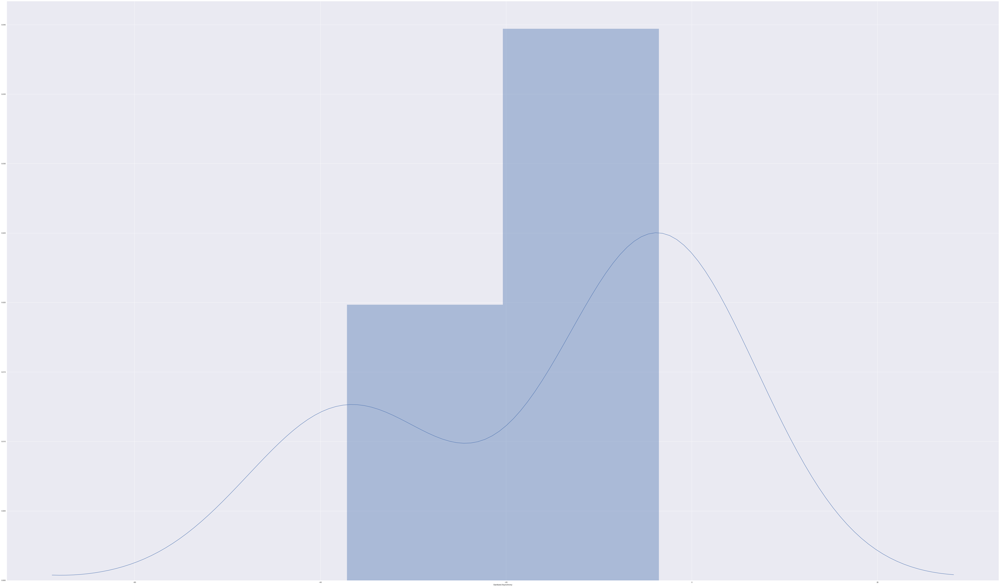

In [113]:
#Performance per Test
group_df = df.groupby(['Group'])
test = group_df['Sanitized Asynchrony'].mean()
sns.distplot(test);

In [20]:
#Performance per User
grouped_df = df.groupby(['Group','Instrument','User ID','Test']);
# grouped_df = df.groupby(['Instrument']);
# x = grouped_df['Sanitized Asynchrony'].mean()
# sns.distplot(x)
grouped_df['Sanitized Asynchrony'].describe().to_csv('/Users/nickpourazima/GitHub/he-sm/python/Analysis/test.csv')

In [142]:
grouped_sub = df.groupby(['Test', 'User ID'])
means = grouped_sub['Latency Corrected Sanitized Asynchrony'].mean()
x, y = means[(a3b)].values,means[(h2b)].values
t_value = paired_ttest(x,y)
for key, value in t_value.items():
    t_value[key] = round(value, 3)
print(t_value)

{'T-value': 1.332, 'Degree of Freedom': 63, 'P-value': 0.188}


In [341]:
stats.ttest_rel(a=x,b=y)

Ttest_relResult(statistic=-2.8284554562438426, pvalue=0.10557101718037978)

In [92]:
stats.t.ppf(q=0.025,df=9)

-2.262157162740992

In [93]:
stats.t.ppf(q=0.975,df=9)

2.2621571627409915

In [94]:
stats.t.cdf(x=-0.53,df=9)*2

0.6089366906430735

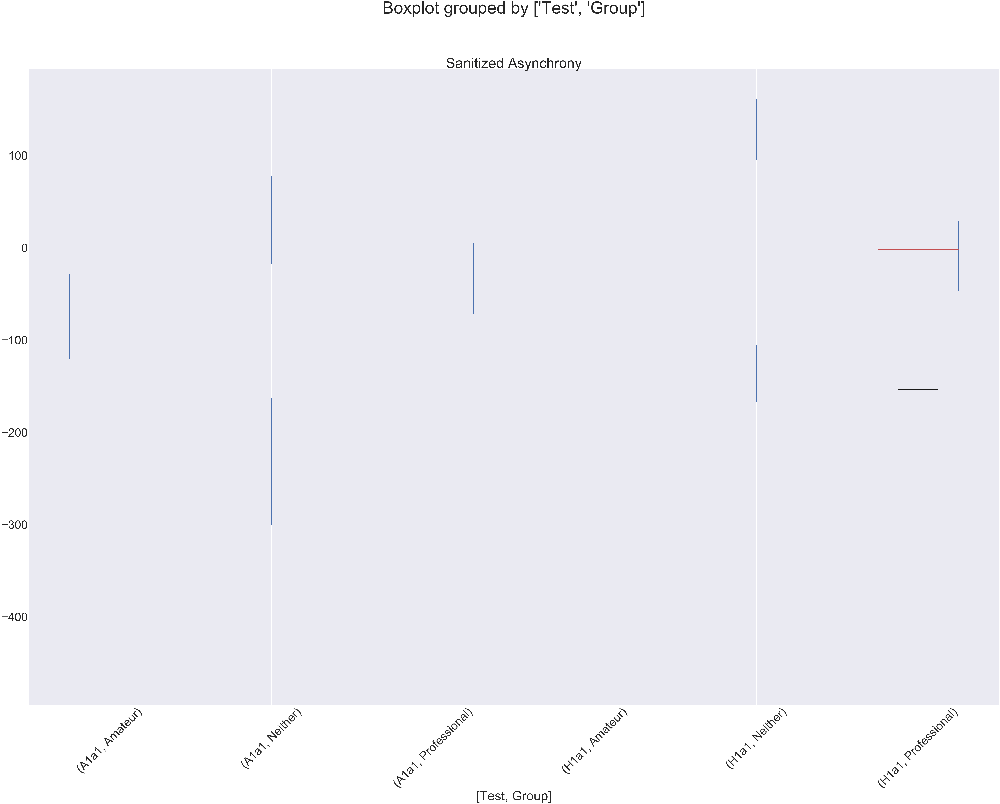

In [368]:
fig,ax = plt.subplots()
compare_1 = df.loc[df['Test'].isin(['A1a1','H1a1'])];
compare_1.boxplot(column=['Sanitized Asynchrony'],by=['Test','Group'],ax=ax);
plt.xticks(rotation=45);
# compare_1.iplot(kind='box',filename='cufflinks/box-plots')

In [144]:
data = df.loc[df['Test'].isin(['A1a1','H1a1'])];
 
#Create a boxplot
# data.boxplot('Sanitized Asynchrony', by='Group')
 
# ctrl = data['Sanitized Asynchrony'][data.Group == 'Professional']
 
# grps = pd.unique(data.Group.values)
# d_data = {grp:data['Sanitized Asynchrony'][data.Group == grp] for grp in grps}
 
# k = len(pd.unique(data.Group))  # number of conditions
# N = len(data.values)  # conditions times participants
# n = data.groupby('Group').size()[0] #Participants in each condition
# DFbetween = k - 1
# DFwithin = N - k
# DFtotal = N - 1
# SSbetween = (sum(data.groupby('Group').sum()['Sanitized Asynchrony']**2)/n) - (data['Sanitized Asynchrony'].sum()**2)/N
# sum_y_squared = sum([value**2 for value in data['Sanitized Asynchrony'].values])
# SSwithin = sum_y_squared - sum(data.groupby('Group').sum()['Sanitized Asynchrony']**2)/n
# SStotal = sum_y_squared - (data['Sanitized Asynchrony'].sum()**2)/N
# MSbetween = SSbetween/DFbetween
# MSwithin = SSwithin/DFwithin
# F = MSbetween/MSwithin
# p = stats.f.sf(F, DFbetween, DFwithin)
# eta_sqrdet  = SSbetween/SStotal
# om_sqrd = (SSbetween - (DFbetween * MSwithin))/(SStotal + MSwithin)

weight = data['Latency Corrected Sanitized Asynchrony']
group = data['User ID']

mod = ols('weight ~ group',
                data=data).fit()
                
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)


                sum_sq     df         F    PR(>F)
group     4.323702e+04    1.0  2.307146  0.129668
Residual  6.671609e+06  356.0       NaN       NaN


In [150]:
data1 = df.loc[df['Test'].isin(a1)]['Latency Corrected Sanitized Asynchrony'].dropna().tolist()
data2 = df.loc[df['Test'].isin(h1)]['Latency Corrected Sanitized Asynchrony'].dropna().tolist()
twosample_results = stats.ttest_ind(data1, data2)
matrix_twosample = [
    ['', 'Test Statistic', 'p-value'],
    ['Data', twosample_results[0], twosample_results[1]]
]
twosample_table = FF.create_table(matrix_twosample, index=True)

# Group data together
hist_data = [data1, data2]#, x3, x4]

group_labels = ['A1', 'H1']#, 'Group 3', 'Group 4']

# Create distplot with custom bin_size

fig = FF.create_distplot(hist_data, group_labels,colors = ['rgb(0, 0, 100)', 'rgb(0, 200, 200)'])

# Plot!
# offline.plot(fig, filename='Distplot with Multiple Datasets',image='jpeg')
py.iplot(twosample_table, filename='twosample-table')

/usr/local/lib/python3.6/site-packages/plotly/tools.py:1491: UserWarning:

plotly.tools.FigureFactory.create_table is deprecated. Use plotly.figure_factory.create_table

/usr/local/lib/python3.6/site-packages/plotly/tools.py:1491: UserWarning:

plotly.tools.FigureFactory.create_distplot is deprecated. Use plotly.figure_factory.create_distplot

/usr/local/lib/python3.6/site-packages/plotly/offline/offline.py:459: UserWarning:

Your filename `Distplot with Multiple Datasets` didn't end with .html. Adding .html to the end of your file.



In [182]:
from scipy.stats import ttest_ind
newdf = {
    'A':             [],
    'B':          [],
    'T-Stat':       [],
    'p-value':[],
}
x = []
for item in audibleTests:
    for next in hapticTests:
        test1 = df[df['Test'].isin([item])]
        newdf['A'].append(test1['Test'].values)
        test2 = df[df['Test'].isin([next])]
        newdf['B'].append(test2['Test'].values)
        x = ttest_ind(test1['Latency Corrected Sanitized Asynchrony'].dropna(), test2['Latency Corrected Sanitized Asynchrony'].dropna(),equal_var=False)
        newdf['T-Stat'].append(x[0])
        newdf['p-value'].append(x[1])
rawData = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in newdf.items()]))
print(rawData.head())

                                                   A  \
0  [A1a1, A1a1, A1a1, A1a1, A1a1, A1a1, A1a1, A1a...   
1  [A1a1, A1a1, A1a1, A1a1, A1a1, A1a1, A1a1, A1a...   
2  [A1a1, A1a1, A1a1, A1a1, A1a1, A1a1, A1a1, A1a...   
3  [A1a1, A1a1, A1a1, A1a1, A1a1, A1a1, A1a1, A1a...   
4  [A1a1, A1a1, A1a1, A1a1, A1a1, A1a1, A1a1, A1a...   

                                                   B     T-Stat       p-value  
0  [H1a1, H1a1, H1a1, H1a1, H1a1, H1a1, H1a1, H1a...  21.429378  7.456834e-65  
1  [H1a2, H1a2, H1a2, H1a2, H1a2, H1a2, H1a2, H1a...   7.265537  3.093237e-12  
2  [H1a3, H1a3, H1a3, H1a3, H1a3, H1a3, H1a3, H1a...  -4.418270  1.507420e-05  
3  [H1a4, H1a4, H1a4, H1a4, H1a4, H1a4, H1a4, H1a... -11.090666  6.648262e-23  
4  [H1b1, H1b1, H1b1, H1b1, H1b1, H1b1, H1b1, H1b...  17.145940  7.375952e-47  
